In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from matplotlib import pyplot
from scipy import stats
from sklearn.metrics import classification_report



# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/credit-card-detaction/default of credit card clients.xls


In [2]:
!pip install xlrd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 363.0 kB/s eta 0:00:00a 0:00:01


In [3]:
import pandas as pd
df = pd.read_excel("/kaggle/input/credit-card-detaction/default of credit card clients.xls",
                  header = 1)
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,female,university,married,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,female,university,single,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,female,university,single,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,female,university,married,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,male,university,married,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   ID                          30000 non-null  int64 
 1   LIMIT_BAL                   30000 non-null  int64 
 2   SEX                         30000 non-null  object
 3   EDUCATION                   29669 non-null  object
 4   MARRIAGE                    29677 non-null  object
 5   AGE                         30000 non-null  int64 
 6   PAY_0                       30000 non-null  int64 
 7   PAY_2                       30000 non-null  int64 
 8   PAY_3                       30000 non-null  int64 
 9   PAY_4                       30000 non-null  int64 
 10  PAY_5                       30000 non-null  int64 
 11  PAY_6                       30000 non-null  int64 
 12  BILL_AMT1                   30000 non-null  int64 
 13  BILL_AMT2                   30000 non-null  in

## Handle Categorical Data, by usind pandas dummies and label encoding

In [5]:
# Display value counts for MARRIAGE
df['MARRIAGE'].value_counts()

single     15964
married    13659
0             54
Name: MARRIAGE, dtype: int64

In [6]:
# Display value counts for education
df['EDUCATION'].value_counts()

university         14030
graduate school    10585
high school         4916
others               124
0                     14
Name: EDUCATION, dtype: int64

## Found out some values equel to zero in MARRIAGE assigned to single if age < 25 and married if age > 25 according to their age 

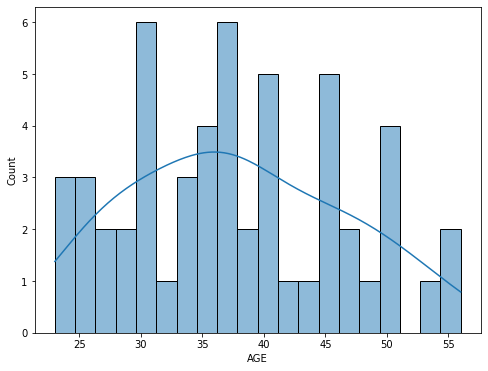

In [7]:
# it's appeared that all people with marrage == 0 still studying so it's make sence to assign to single
ax = plt.figure(figsize=(8,6))
ax = sns.histplot(df[df['MARRIAGE'] == 0]["AGE"], bins = 20, kde=True)

In [8]:
#Filling Zero values with single or maried according to age astemation in marrage
index_marr_zero_single = df[(df.MARRIAGE == 0) & (df.AGE <= 25)].index
df.loc[index_marr_zero_single, "MARRIAGE"] = "single"
index_marr_zero_Married = df[(df.MARRIAGE == 0) & (df.AGE > 25)].index
df.loc[index_marr_zero_Married, "MARRIAGE"] = "married"
df['MARRIAGE'].value_counts()

single     15967
married    13710
Name: MARRIAGE, dtype: int64

#### Handling Zero Values in Education, Visualize the target column defaault payement with education grouped by the total count of peole, Also transfer the values to log scale help me to see the small num of education like other, zero vlaue after visualization it was obevious that zero value is to much close for other, and at least 1/3 for universtiy pay thier loans much education level you have increase the probability of paying the loan

In [9]:
#Rename Target column
df.rename(columns = {"default payment next month": "payment_next_month"}, inplace=True)
df_edu = df.groupby(by=["payment_next_month"])["EDUCATION"].value_counts()
df_edu

payment_next_month  EDUCATION      
0                   university         10700
                    graduate school     8549
                    high school         3679
                    others               117
                    0                     14
1                   university          3330
                    graduate school     2036
                    high school         1237
                    others                 7
Name: EDUCATION, dtype: int64

[Text(0.5, 0, 'payment_next_month'),
 Text(0, 0.5, 'EDUCATION'),
 Text(0.5, 1.0, 'Ration_of_payment_according_to_education')]

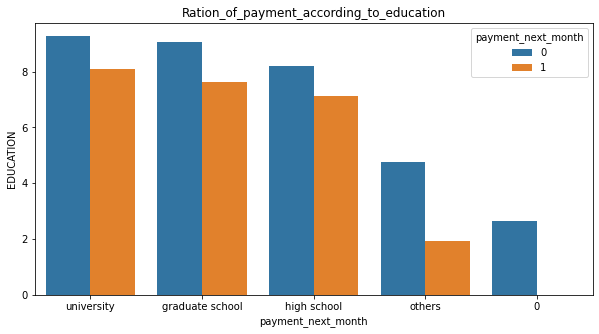

In [10]:
ax1 = plt.figure(figsize=(10,5))
ax1 = sns.barplot(x = df_edu.index.get_level_values(1), y = np.log(df_edu.values),
            hue=df_edu.index.get_level_values(0))
ax1.set(xlabel="payment_next_month", ylabel="EDUCATION",
        title="Ration_of_payment_according_to_education")

In [11]:
# plooting education with target
# calssify the default payment next month according to education
education_pay = df.groupby(["EDUCATION", "payment_next_month"])[["payment_next_month"]].count()
education_pay

payment_next_month
EDUCATION       payment_next_month                    
0               0                                   14
graduate school 0                                 8549
                1                                 2036
high school     0                                 3679
                1                                 1237
others          0                                  117
                1                                    7
university      0                                10700
                1                                 3330

[Text(0.5, 0, 'payment_next_month'),
 Text(0, 0.5, 'EDUCATION'),
 Text(0.5, 1.0, 'Ration_of_payment_according_to_education')]

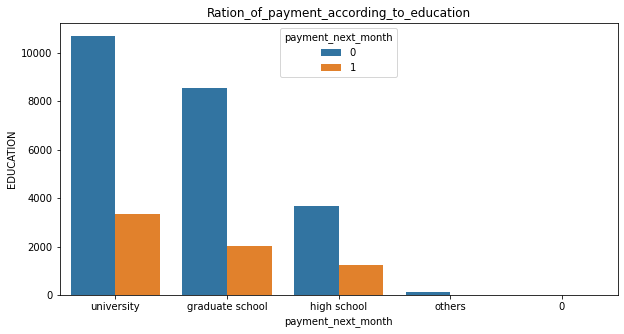

In [12]:
# Without log scale
ax1 = plt.figure(figsize=(10,5))
ax1 = sns.barplot(x = df_edu.index.get_level_values(1), y = df_edu.values,
            hue=df_edu.index.get_level_values(0))
ax1.set(xlabel="payment_next_month", ylabel="EDUCATION",
        title="Ration_of_payment_according_to_education")

In [13]:
#Fill categorical data with the most frequantly
df['EDUCATION'].fillna(df['EDUCATION'].mode()[0], inplace=True)
df['MARRIAGE'].fillna(df['MARRIAGE'].mode()[0], inplace=True)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ID                  30000 non-null  int64 
 1   LIMIT_BAL           30000 non-null  int64 
 2   SEX                 30000 non-null  object
 3   EDUCATION           30000 non-null  object
 4   MARRIAGE            30000 non-null  object
 5   AGE                 30000 non-null  int64 
 6   PAY_0               30000 non-null  int64 
 7   PAY_2               30000 non-null  int64 
 8   PAY_3               30000 non-null  int64 
 9   PAY_4               30000 non-null  int64 
 10  PAY_5               30000 non-null  int64 
 11  PAY_6               30000 non-null  int64 
 12  BILL_AMT1           30000 non-null  int64 
 13  BILL_AMT2           30000 non-null  int64 
 14  BILL_AMT3           30000 non-null  int64 
 15  BILL_AMT4           30000 non-null  int64 
 16  BILL_AMT5           30

<AxesSubplot:xlabel='payment_next_month', ylabel='Count'>

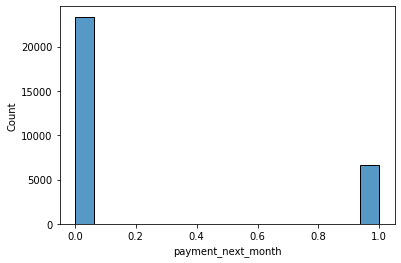

In [15]:
#plotting hist of target value()
sns.histplot(df["payment_next_month"])
## it's Apeard that we have unpalanced data

In [16]:
# Describing all stats
df.describe()

,ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment_next_month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,35.518833,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,9.528019,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,267.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


#### --> I have abnormal value in age so i will drop all values over 100

In [17]:
# drop all age over 100 year
# it's about 7 poeple have not sensable age
df.drop(df[df["AGE"] > 100].index, inplace = True)

In [18]:
df.describe()

,ID,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment_next_month
count,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,...,29993.000000,29993.000000,29993.000000,29993.000000,2.999300e+04,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000
mean,15001.792218,167466.064748,35.483880,-0.016704,-0.133731,-0.166172,-0.220651,-0.266195,-0.291135,51213.921782,...,43257.648118,40305.052346,38865.417731,5662.802087,5.921459e+03,5225.759711,4824.861634,4799.677625,5212.768613,0.221185
std,8660.057774,129728.800656,9.216058,1.123844,1.197304,1.196986,1.169254,1.133299,1.150107,73628.213950,...,64331.004866,60795.589008,59552.828263,16564.744924,2.304344e+04,17608.867436,15666.283702,15279.995661,17771.016667,0.415052
min,1.000000,10000.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7504.000000,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3559.000000,...,2326.000000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.000000,296.000000,251.000000,116.000000,0.000000
50%,15003.000000,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.000000,...,19052.000000,18104.000000,17068.000000,2100.000000,2.009000e+03,1800.000000,1500.000000,1500.000000,1500.000000,0.000000
75%,22501.000000,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67088.000000,...,54486.000000,50180.000000,49171.000000,5006.000000,5.000000e+03,4504.000000,4012.000000,4031.000000,4000.000000,0.000000
max,30000.000000,1000000.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000


#### Checking the outlies value and found that we have to many outliers, I will drop it after transfer categorical data to numerical data

[Text(0, 0, 'ID'),
 Text(1, 0, 'LIMIT_BAL'),
 Text(2, 0, 'AGE'),
 Text(3, 0, 'PAY_0'),
 Text(4, 0, 'PAY_2'),
 Text(5, 0, 'PAY_3'),
 Text(6, 0, 'PAY_4'),
 Text(7, 0, 'PAY_5'),
 Text(8, 0, 'PAY_6'),
 Text(9, 0, 'BILL_AMT1'),
 Text(10, 0, 'BILL_AMT2'),
 Text(11, 0, 'BILL_AMT3'),
 Text(12, 0, 'BILL_AMT4'),
 Text(13, 0, 'BILL_AMT5'),
 Text(14, 0, 'BILL_AMT6'),
 Text(15, 0, 'PAY_AMT1'),
 Text(16, 0, 'PAY_AMT2'),
 Text(17, 0, 'PAY_AMT3'),
 Text(18, 0, 'PAY_AMT4'),
 Text(19, 0, 'PAY_AMT5'),
 Text(20, 0, 'PAY_AMT6'),
 Text(21, 0, 'payment_next_month')]

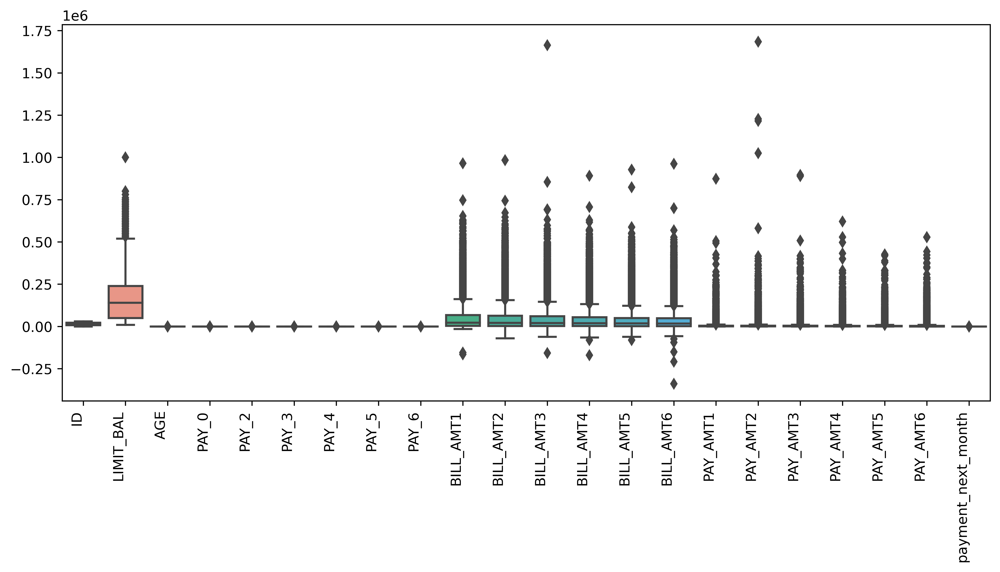

In [19]:
## Looking for the outlier
pyplot.figure(figsize=(12, 5), dpi = 600)
ax1 = sns.boxplot(data=df)
ax1.set_xticklabels(ax1.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right')

In [20]:
# converte categrrical sex to one hot encoding
df = pd.get_dummies(df, columns = ["SEX"])
df = pd.get_dummies(df, columns = ["MARRIAGE"])

In [21]:
# encoding Education Categrorical data
df['EDUCATION'].replace(['university', 'graduate school', "others", "high school", 0],
                        [4,3,1,2, 0], inplace=True)

In [22]:
df["EDUCATION"].unique()

array([4, 3, 1, 2, 0])

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29993 entries, 0 to 29999
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   ID                  29993 non-null  int64
 1   LIMIT_BAL           29993 non-null  int64
 2   EDUCATION           29993 non-null  int64
 3   AGE                 29993 non-null  int64
 4   PAY_0               29993 non-null  int64
 5   PAY_2               29993 non-null  int64
 6   PAY_3               29993 non-null  int64
 7   PAY_4               29993 non-null  int64
 8   PAY_5               29993 non-null  int64
 9   PAY_6               29993 non-null  int64
 10  BILL_AMT1           29993 non-null  int64
 11  BILL_AMT2           29993 non-null  int64
 12  BILL_AMT3           29993 non-null  int64
 13  BILL_AMT4           29993 non-null  int64
 14  BILL_AMT5           29993 non-null  int64
 15  BILL_AMT6           29993 non-null  int64
 16  PAY_AMT1            29993 non-null  int6

In [24]:
df.describe()

,ID,LIMIT_BAL,EDUCATION,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment_next_month,SEX_female,SEX_male,MARRIAGE_married,MARRIAGE_single
count,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,...,2.999300e+04,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000,29993.000000
mean,15001.792218,167466.064748,3.305205,35.483880,-0.016704,-0.133731,-0.166172,-0.220651,-0.266195,-0.291135,...,5.921459e+03,5225.759711,4824.861634,4799.677625,5212.768613,0.221185,0.603741,0.396259,0.456973,0.543027
std,8660.057774,129728.800656,0.755088,9.216058,1.123844,1.197304,1.196986,1.169254,1.133299,1.150107,...,2.304344e+04,17608.867436,15666.283702,15279.995661,17771.016667,0.415052,0.489128,0.489128,0.498154,0.498154
min,1.000000,10000.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7504.000000,50000.000000,3.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,8.330000e+02,390.000000,296.000000,251.000000,116.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,15003.000000,140000.000000,3.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.009000e+03,1800.000000,1500.000000,1500.000000,1500.000000,0.000000,1.000000,0.000000,0.000000,1.000000
75%,22501.000000,240000.000000,4.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.000000e+03,4504.000000,4012.000000,4031.000000,4000.000000,0.000000,1.000000,1.000000,1.000000,1.000000
max,30000.000000,1000000.000000,4.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [25]:
## Removing the data outlier using Z-Score
# if data have more than 3 std will be removed
df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]

[Text(0, 0, 'ID'),
 Text(1, 0, 'LIMIT_BAL'),
 Text(2, 0, 'EDUCATION'),
 Text(3, 0, 'AGE'),
 Text(4, 0, 'PAY_0'),
 Text(5, 0, 'PAY_2'),
 Text(6, 0, 'PAY_3'),
 Text(7, 0, 'PAY_4'),
 Text(8, 0, 'PAY_5'),
 Text(9, 0, 'PAY_6'),
 Text(10, 0, 'BILL_AMT1'),
 Text(11, 0, 'BILL_AMT2'),
 Text(12, 0, 'BILL_AMT3'),
 Text(13, 0, 'BILL_AMT4'),
 Text(14, 0, 'BILL_AMT5'),
 Text(15, 0, 'BILL_AMT6'),
 Text(16, 0, 'PAY_AMT1'),
 Text(17, 0, 'PAY_AMT2'),
 Text(18, 0, 'PAY_AMT3'),
 Text(19, 0, 'PAY_AMT4'),
 Text(20, 0, 'PAY_AMT5'),
 Text(21, 0, 'PAY_AMT6'),
 Text(22, 0, 'payment_next_month'),
 Text(23, 0, 'SEX_female'),
 Text(24, 0, 'SEX_male'),
 Text(25, 0, 'MARRIAGE_married'),
 Text(26, 0, 'MARRIAGE_single')]

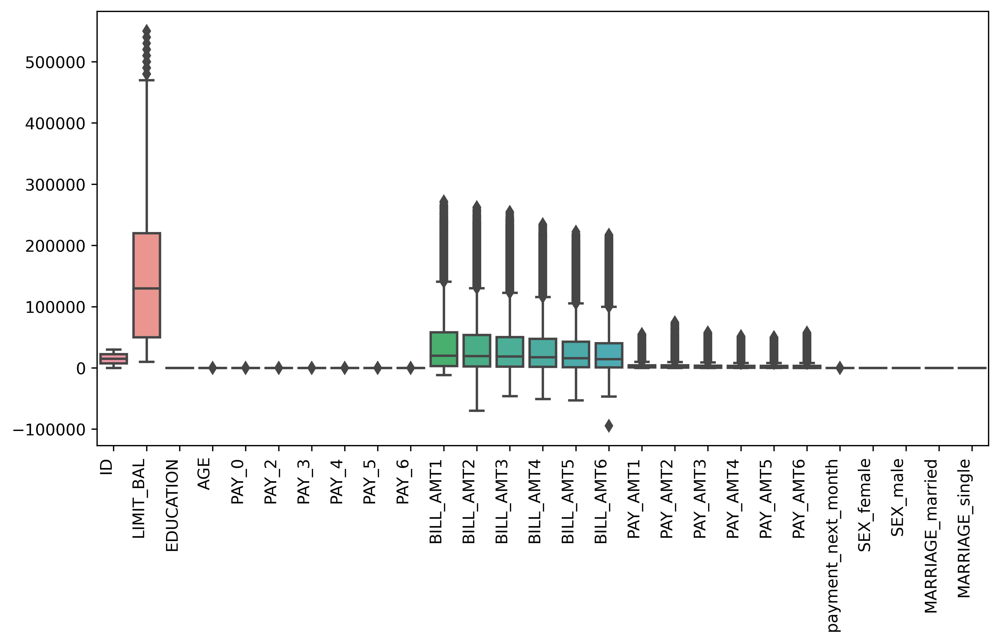

In [26]:
## Looking for outlier after removing < 3std data
## Looking for the outlier
pyplot.figure(figsize=(10, 5), dpi = 600)
ax1 = sns.boxplot(data=df)
ax1.set_xticklabels(ax1.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right')

<Figure size 432x288 with 0 Axes>

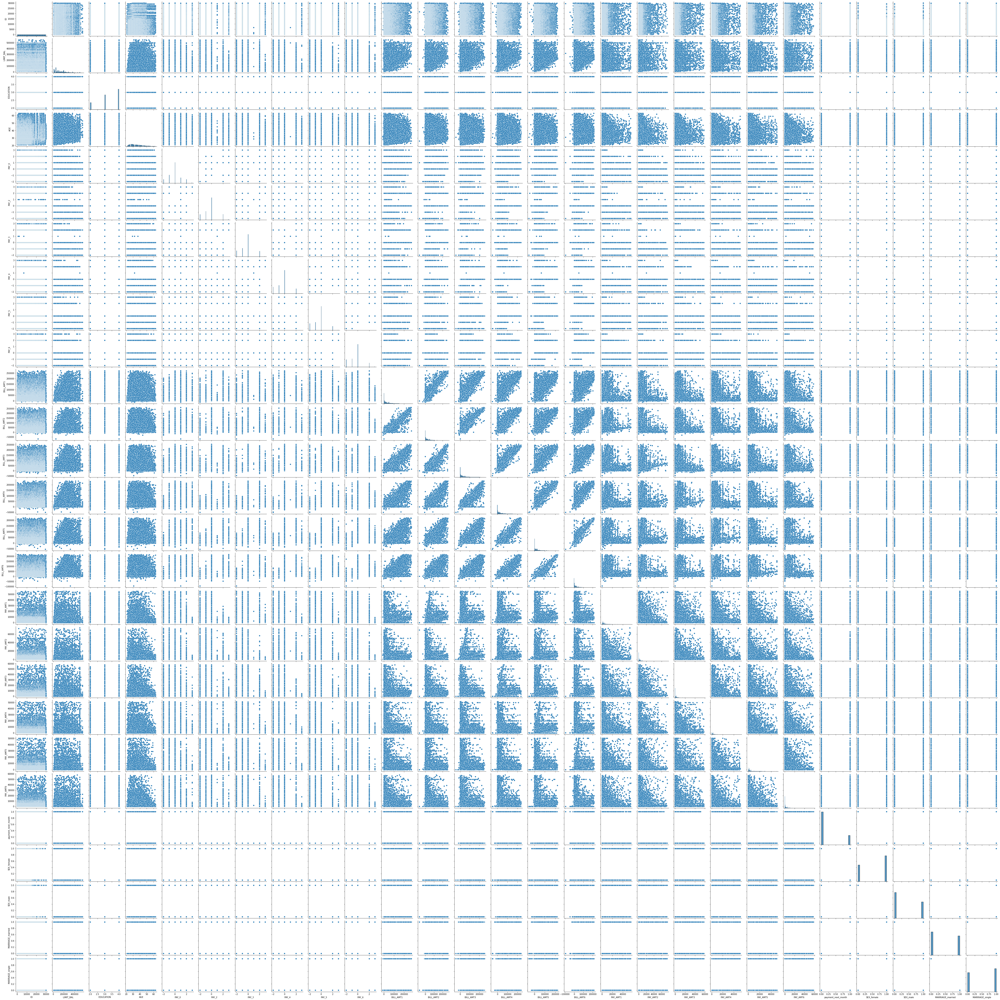

In [27]:
### ploting data pairplot
pair_plot = plt.figure()
pair_plot = sns.pairplot(df)
plt.savefig("pair_plot.png")

#### it's okay nothing abnormal about data scattaring after removing outliers
#### Let's check the colleration between features and target

## printing df columns to check the corr matrix
## Because there are too many column i will check the corr matrix betwwen a set of columns 

In [28]:
print(df.columns)

Index(['ID', 'LIMIT_BAL', 'EDUCATION', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
       'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2',
       'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'payment_next_month',
       'SEX_female', 'SEX_male', 'MARRIAGE_married', 'MARRIAGE_single'],
      dtype='object')


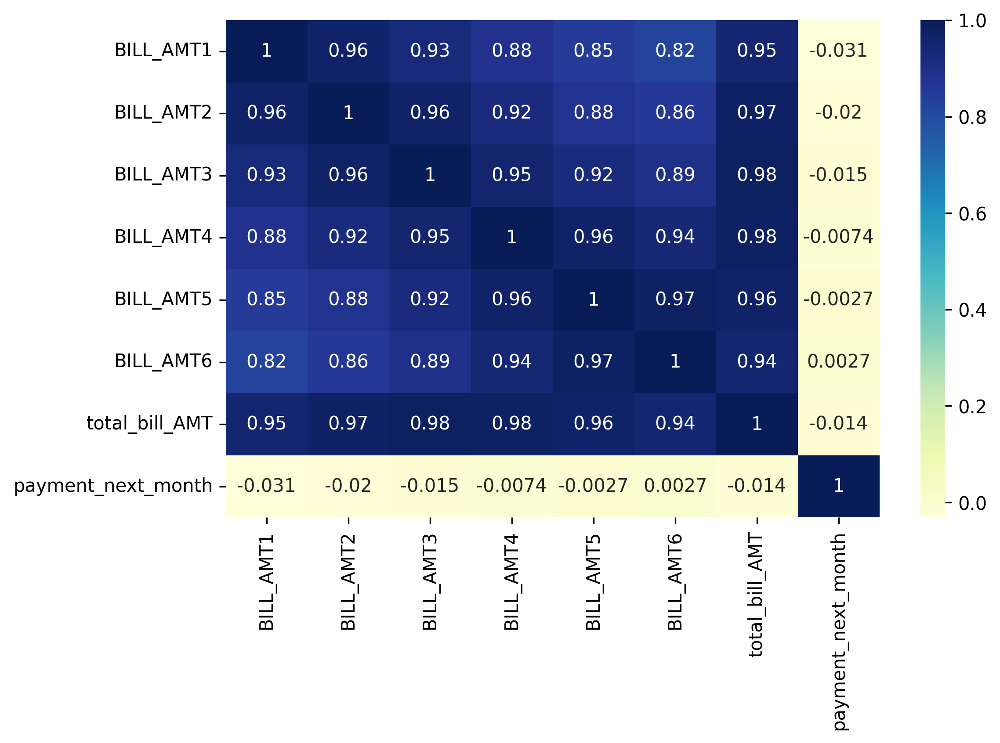

In [29]:
## let's have a column with the total bill
df["total_bill_AMT"] = df[["BILL_AMT1", "BILL_AMT2", "BILL_AMT3", "BILL_AMT4", "BILL_AMT5", "BILL_AMT6"]].sum(axis=1)
bill_column_corr_fig = plt.figure(figsize=(8,5), dpi = 300)
corr_matrix = df.corr()
bill_column_corr = corr_matrix.loc[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
                   'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6','total_bill_AMT','payment_next_month'],
                   ['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3','BILL_AMT4',
                    'BILL_AMT5', 'BILL_AMT6','total_bill_AMT', 'payment_next_month']]
bill_column_corr_fig = sns.heatmap(bill_column_corr, annot=True, cmap = "YlGnBu")
## obevies that these column is highly collerated with-
# each other let's check the coleration with target

In [30]:
bill_target_corr = corr_matrix.loc[['payment_next_month'], ['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
                                   'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']]
bill_target_corr

,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6
payment_next_month,-0.031384,-0.020169,-0.014608,-0.007412,-0.002707,0.002707


#### I see that first three column is almost the same, and last three also is almost the same corr with target and each other so i will keep only one column for payment in the first three month and one column in the last three month plus agregatted column with all payent in the six months

In [31]:
df.drop(["BILL_AMT1", 'BILL_AMT3', 'BILL_AMT4', "BILL_AMT5"],axis = 1 ,inplace=True)
df.columns

Index(['ID', 'LIMIT_BAL', 'EDUCATION', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT2', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'payment_next_month', 'SEX_female', 'SEX_male', 'MARRIAGE_married',
       'MARRIAGE_single', 'total_bill_AMT'],
      dtype='object')

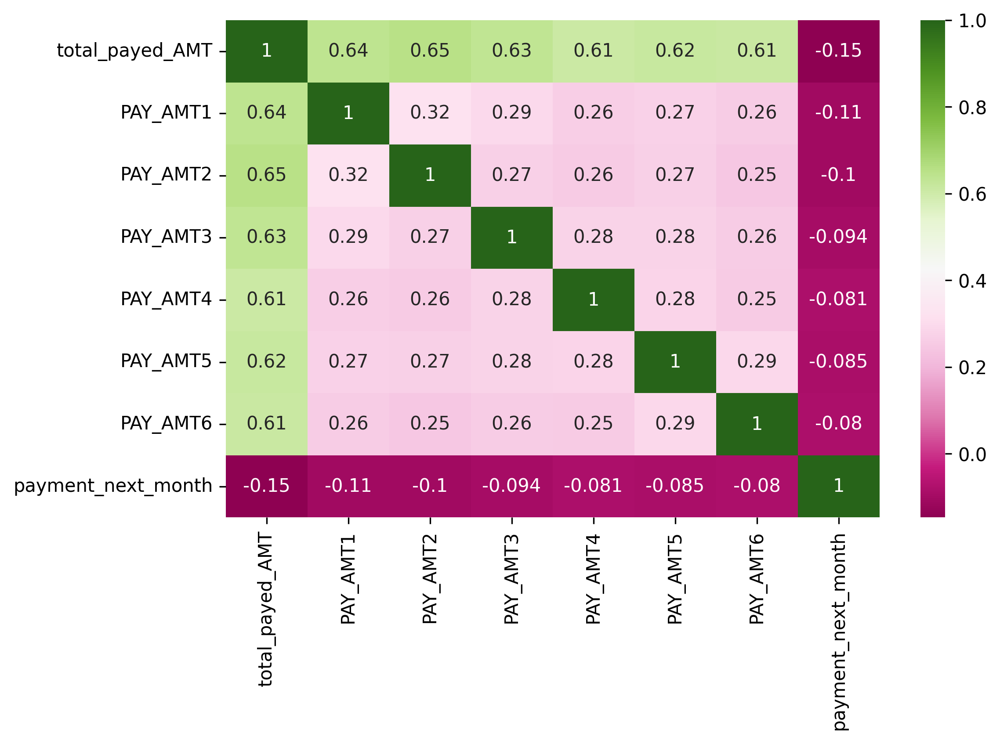

In [32]:
## Before visualizing the corr let's have a column of total payement
df["total_payed_AMT"] = df[["PAY_AMT1", "PAY_AMT2", "PAY_AMT3", "PAY_AMT4", "PAY_AMT5", "PAY_AMT6"]].sum(axis=1)
corr_matrix = df.corr()
payment_column_corr_fig = plt.figure(figsize=(8,5), dpi = 300)
payment_column_corr = corr_matrix.loc[['total_payed_AMT','PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6','payment_next_month'], ['total_payed_AMT','PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6','payment_next_month']]
payment_column_corr_fig = sns.heatmap(payment_column_corr, annot=True, cmap = "PiYG")
## I think the payment data not highly collerated with each other so we could keep all columns

In [33]:
# Let's see how much payment columns corr with target
payed_target_corr = corr_matrix.loc[['payment_next_month'], ['total_payed_AMT','PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
                                                       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']]
payed_target_corr

,total_payed_AMT,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
payment_next_month,-0.14687,-0.106339,-0.104308,-0.09401,-0.081324,-0.084692,-0.079718


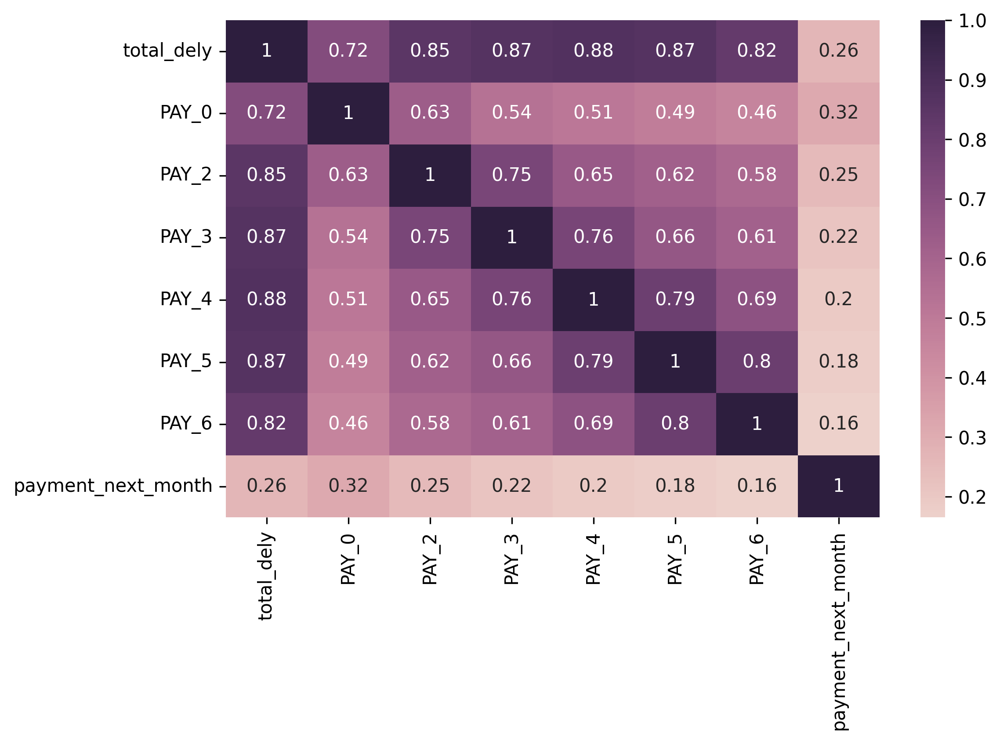

In [34]:
# Le's check the corr for another set of columns with payed delys moonths
## Before visualizing the corr let's have a column of avg delay months
df["total_dely"] = df[["PAY_0", "PAY_2", "PAY_3", "PAY_4", "PAY_5", "PAY_6"]].mean(axis=1)
corr_matrix = df.corr()
delay_column_corr_fig = plt.figure(figsize=(8,5), dpi = 300)
dely_column_corr = corr_matrix.loc[['total_dely','PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6','payment_next_month'], ['total_dely','PAY_0', 'PAY_2', 'PAY_3',
       'PAY_4', 'PAY_5', 'PAY_6','payment_next_month']]
delay_column_corr_fig = sns.heatmap(dely_column_corr, annot=True, 
                                    cmap = sns.cubehelix_palette(as_cmap=True))

#### I will try to drop from pay_3 to pay_6 
#### I think that avg delay have a fair corrlation with the target and eah one of them

In [35]:
df.drop([ 'PAY_3','PAY_4', 'PAY_5', 'PAY_6'], axis = 1, inplace=True)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26567 entries, 0 to 29999
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  26567 non-null  int64  
 1   LIMIT_BAL           26567 non-null  int64  
 2   EDUCATION           26567 non-null  int64  
 3   AGE                 26567 non-null  int64  
 4   PAY_0               26567 non-null  int64  
 5   PAY_2               26567 non-null  int64  
 6   BILL_AMT2           26567 non-null  int64  
 7   BILL_AMT6           26567 non-null  int64  
 8   PAY_AMT1            26567 non-null  int64  
 9   PAY_AMT2            26567 non-null  int64  
 10  PAY_AMT3            26567 non-null  int64  
 11  PAY_AMT4            26567 non-null  int64  
 12  PAY_AMT5            26567 non-null  int64  
 13  PAY_AMT6            26567 non-null  int64  
 14  payment_next_month  26567 non-null  int64  
 15  SEX_female          26567 non-null  uint8  
 16  SEX_

#### Visualizing the credit limit with total bill
#### Visualizing the credit limit with payment_next_month
#### Visualizing the age with total bill
#### Visualizing the age with payment_next_month

Text(0.5, 1.0, 'Age with target column')

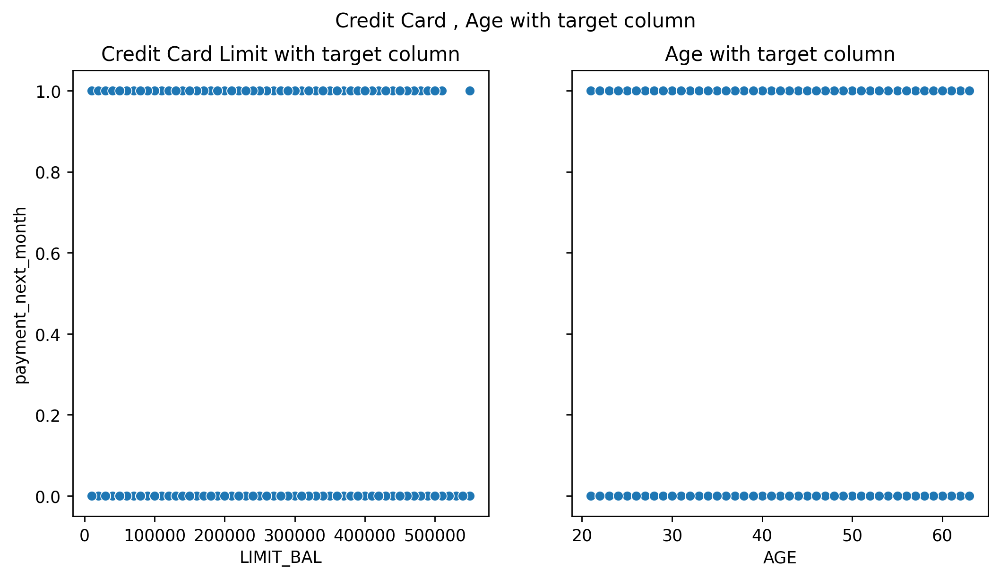

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True, dpi=250)

fig.suptitle('Credit Card , Age with target column')
sns.scatterplot(ax=axes[0], data=df, x="LIMIT_BAL", y="payment_next_month")
axes[0].set_title("Credit Card Limit with target column")

sns.scatterplot(ax=axes[1], data=df, x="AGE", y="payment_next_month")
axes[1].set_title("Age with target column")


Text(0.5, 1.0, 'Age with total_bill_AMT')

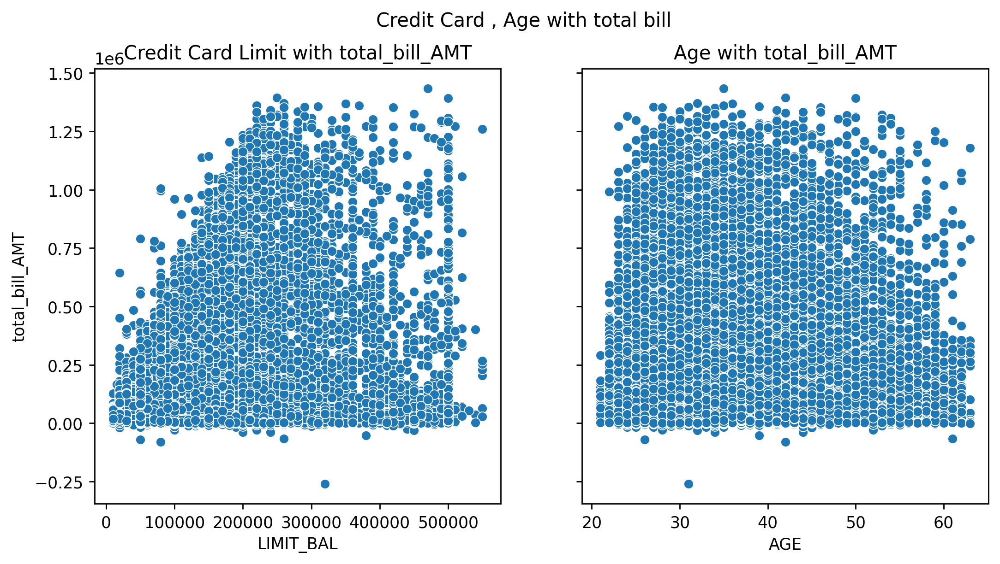

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True, dpi=250)

fig.suptitle('Credit Card , Age with total bill ')

sns.scatterplot(ax=axes[0], data=df, x="LIMIT_BAL", y="total_bill_AMT")
axes[0].set_title("Credit Card Limit with total_bill_AMT")

sns.scatterplot(ax=axes[1], data=df, x="AGE", y="total_bill_AMT")
axes[1].set_title("Age with total_bill_AMT")


In [39]:
# I think limit bal with total bill has a shape of quadration so it will square the limit bal
df["square_LIMIT_BAL"] = df["LIMIT_BAL"]**2

In [40]:
# Integrate x_data, y_data
X_data = df[["square_LIMIT_BAL", "EDUCATION", "AGE", "PAY_0", "PAY_2", "BILL_AMT2",
            "BILL_AMT6", "PAY_AMT1", "PAY_AMT2", "PAY_AMT3", "PAY_AMT4", "PAY_AMT5", "PAY_AMT6",
            "SEX_female", "SEX_male", "MARRIAGE_married", "MARRIAGE_single", "total_bill_AMT",
             "total_payed_AMT", "total_dely"]]
y_data = df["payment_next_month"]

In [41]:
# Splitting data into train, test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.20, random_state=43, shuffle=True)

#### I have tried to normaize y_data, but i see it's not important step so only feature normalization

In [42]:
#Normalizing the training data
from sklearn import preprocessing

x_min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = x_min_max_scaler.fit_transform(X_train.values)


#y_min_max_scaler = preprocessing.MinMaxScaler()
#y_train_minmax = y_min_max_scaler.fit_transform(y_train.values.reshape(-1, 1))

In [43]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=43, n_jobs=-1, n_estimators=150, max_depth = 25)
clf.fit(X_train_minmax, y_train.ravel())

RandomForestClassifier(max_depth=25, n_estimators=150, n_jobs=-1,
                       random_state=43)

In [44]:
# normalizing test data
#Normalizing the training data
X_test_minmax = x_min_max_scaler.transform(X_test.values)
#y_test_minmax = y_min_max_scaler.transform(y_test.values.reshape(-1, 1))

In [45]:
# Predicting Values using Randomofrest clf
y_pred_invesr = clf.predict(X_test_minmax)
#y_pred_invesr = y_min_max_scaler.inverse_transform(y_pred.reshape(-1,1))

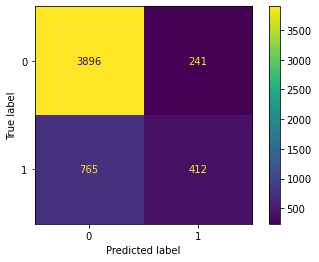

In [46]:
# Visualize confusion Matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred_invesr, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clf.classes_)
disp.plot()
plt.show()

In [47]:
# classifiction report for random forest clf
print(classification_report(y_pred_invesr, y_test))

              precision    recall  f1-score   support

           0       0.94      0.84      0.89      4661
           1       0.35      0.63      0.45       653

    accuracy                           0.81      5314
   macro avg       0.65      0.73      0.67      5314
weighted avg       0.87      0.81      0.83      5314



In [48]:
## Spllitting data using stratify and train it with hyperprametart tunnig for randomforest
# Splitting data into train, test data
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.20, random_state=43, shuffle=True, stratify = y_data)


#Normalizing the training data
x_min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = x_min_max_scaler.fit_transform(X_train.values)


#y_min_max_scaler = preprocessing.MinMaxScaler()
#y_train_minmax = y_min_max_scaler.fit_transform(y_train.values.reshape(-1, 1))

In [49]:
# Random forest grid search hypertuning prametars 
from sklearn.model_selection import GridSearchCV
rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'n_estimators': [100 ,150, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4, 5, 6, 7, 8],
    'criterion' :['gini', 'entropy']}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5, n_jobs=-1)
CV_rfc.fit(X_train_minmax, y_train.ravel())

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 150, 200]})

In [50]:
CV_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'auto',
 'n_estimators': 100}

In [51]:
# Filling the algorith with best prametars
rfc1=RandomForestClassifier(random_state=42, max_features='auto', n_estimators= 100, max_depth=7, criterion='gini')
rfc1.fit(X_train_minmax, y_train)

RandomForestClassifier(max_depth=7, random_state=42)

In [52]:
# normalizing test data
#Normalizing the training data
X_test_minmax = x_min_max_scaler.transform(X_test.values)
#y_test_minmax = y_min_max_scaler.transform(y_test.values.reshape(-1, 1))

# Predict the value using randomforest optimizer prametars
op_rf=rfc1.predict(X_test_minmax)
#y_pred_invesr = y_min_max_scaler.inverse_transform(y_pred.reshape(-1,1))


# classifiction report for random forest clf
print(classification_report(op_rf, y_test))

              precision    recall  f1-score   support

           0       0.96      0.83      0.89      4742
           1       0.33      0.68      0.44       572

    accuracy                           0.82      5314
   macro avg       0.64      0.76      0.67      5314
weighted avg       0.89      0.82      0.84      5314



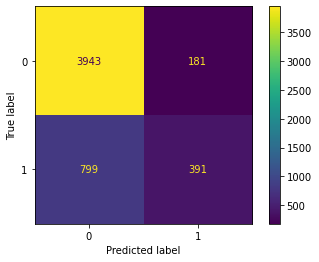

In [54]:
cm = confusion_matrix(y_test, op_rf, labels=rfc1.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=rfc1.classes_)
disp.plot()
plt.show()

#### Using xgboost classifier Dropping 33% of data has a zeor target

(26567,)


<AxesSubplot:xlabel='payment_next_month', ylabel='Count'>

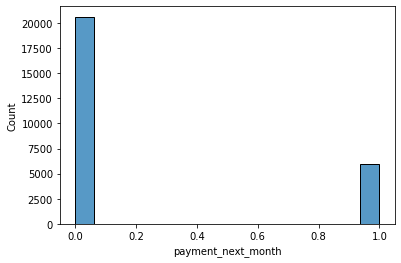

In [55]:
print(df["payment_next_month"].shape)
#plotting hist of target value()
sns.histplot(df["payment_next_month"])
## it's Apeard that we have unpalanced data

In [56]:
df = df.drop(df[df['payment_next_month'] == 0].sample(frac=0.5).index)

(16257,)


<AxesSubplot:xlabel='payment_next_month', ylabel='Count'>

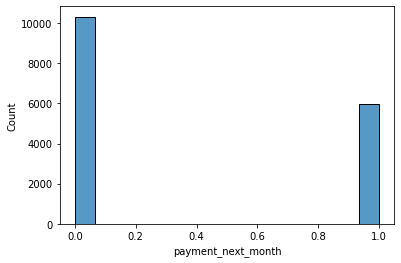

In [57]:
print(df["payment_next_month"].shape)
#plotting hist of target value()
sns.histplot(df["payment_next_month"])
## it's Apeard that we have unpalanced data

In [60]:
df.shape

(16257, 23)

In [58]:
# Integrate x_data, y_data
X_data = df[["square_LIMIT_BAL", "EDUCATION", "AGE", "PAY_0", "PAY_2", "BILL_AMT2",
            "BILL_AMT6", "PAY_AMT1", "PAY_AMT2", "PAY_AMT3", "PAY_AMT4", "PAY_AMT5", "PAY_AMT6",
            "SEX_female", "SEX_male", "MARRIAGE_married", "MARRIAGE_single", "total_bill_AMT",
             "total_payed_AMT", "total_dely"]]
y_data = df["payment_next_month"]
## Spllitting data using stratify and train it with hyperprametart tunnig for randomforest
# Splitting data into train, test data
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.20, random_state=43, shuffle=True, stratify = y_data)


#Normalizing the training data
x_min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = x_min_max_scaler.fit_transform(X_train.values)

In [62]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

# Init classifier
xgb_cl = xgb.XGBClassifier()

# Fit
xgb_cl.fit(X_train_minmax, y_train)

# Predict
X_test_minmax = x_min_max_scaler.transform(X_test.values)
y_pred_invesr = xgb_cl.predict(X_test_minmax)
# Transfore the predicteddata
#y_pred_invesr = y_min_max_scaler.inverse_transform(y_pred.reshape(-1,1))
# Score
accuracy_score(y_test, y_pred_invesr)

0.7321648216482165

In [63]:
print(classification_report(y_pred_invesr, y_test))

              precision    recall  f1-score   support

           0       0.86      0.75      0.80      2353
           1       0.51      0.68      0.58       899

    accuracy                           0.73      3252
   macro avg       0.69      0.72      0.69      3252
weighted avg       0.76      0.73      0.74      3252



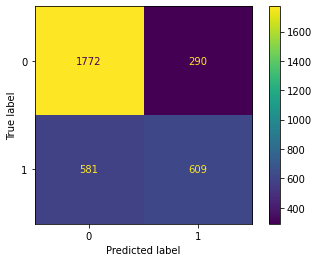

In [64]:
cm = confusion_matrix(y_test, y_pred_invesr, labels=xgb_cl.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clf.classes_)
disp.plot()
plt.show()